In [1]:
import xml.etree.ElementTree as ET

In [2]:
tree = ET.parse('Training_Data/Or 13006_0172.xml')

In [3]:
root = tree.getroot()

In [ ]:
list(root[0])[0].tag

In [4]:
schema = '{http://schema.primaresearch.org/PAGE/gts/pagecontent/2017-07-15}'

In [5]:
page = root.findall(schema+'Page')[0]

In [6]:
text_region = page.findall(schema+'TextRegion')[0]

In [ ]:
text_region[0]

In [ ]:
points = text_region[0].attrib['points'].split()

In [ ]:
tuple(int(point) for point in points[0].split(','))

In [ ]:
coords = [tuple(int(p) for p in point.split(',')) for point in points]

In [ ]:
coords

In [7]:
def parse_coords(points):
    return [tuple(int(p) for p in point.split(',')) for point in points.split()]

In [ ]:
parse_coords(text_region[0].attrib['points'])

In [ ]:
def get_info(root):
    page = root.findall('{http://schema.primaresearch.org/PAGE/gts/pagecontent/2017-07-15}Page')[0]
    w = page.attrib['imageWidth']
    h = page.attrib['imageHeight']
    filename = page.attrib['imageFilename']
    return filename, w, h

In [ ]:
get_info(root)

In [8]:
def get_text_region_coords(page):
    text_region = page.findall(schema+'TextRegion')[0]
    return parse_coords(text_region[0].attrib['points'])

In [9]:
coords = get_text_region_coords(page)

In [10]:
coords

[(895, 1094),
 (3922, 1098),
 (3998, 1098),
 (5642, 1095),
 (5642, 1050),
 (5687, 1050),
 (5687, 1094),
 (5755, 1094),
 (5755, 1211),
 (5757, 1211),
 (5757, 1215),
 (5755, 1215),
 (5755, 1280),
 (5701, 1462),
 (5701, 1534),
 (5712, 1543),
 (5712, 1618),
 (5690, 1840),
 (5690, 1955),
 (5691, 1955),
 (5691, 1979),
 (5695, 1979),
 (5695, 1980),
 (5659, 2028),
 (5659, 2100),
 (5687, 2213),
 (5687, 2362),
 (5619, 2362),
 (5678, 2623),
 (5678, 2633),
 (5682, 2633),
 (5682, 2672),
 (5678, 2728),
 (5678, 2740),
 (5673, 2951),
 (5673, 3065),
 (5669, 3272),
 (5669, 3391),
 (5630, 3464),
 (5653, 3576),
 (5653, 3726),
 (5656, 3726),
 (5656, 3784),
 (5630, 3927),
 (5630, 4024),
 (5626, 4123),
 (5663, 4310),
 (5607, 4463),
 (5575, 4633),
 (5575, 4638),
 (5644, 4686),
 (5632, 4770),
 (5618, 4807),
 (5618, 4851),
 (5646, 4980),
 (5654, 5164),
 (5657, 5507),
 (5608, 5644),
 (5608, 5680),
 (5635, 5726),
 (5635, 5801),
 (5622, 5875),
 (5622, 5889),
 (5668, 6001),
 (5668, 6198),
 (5650, 6441),
 (5650, 654

In [11]:
from skimage import io

In [34]:
im = io.imread('Training_Data/Or 13006_0172.tif')

In [13]:
import matplotlib.pyplot as plt

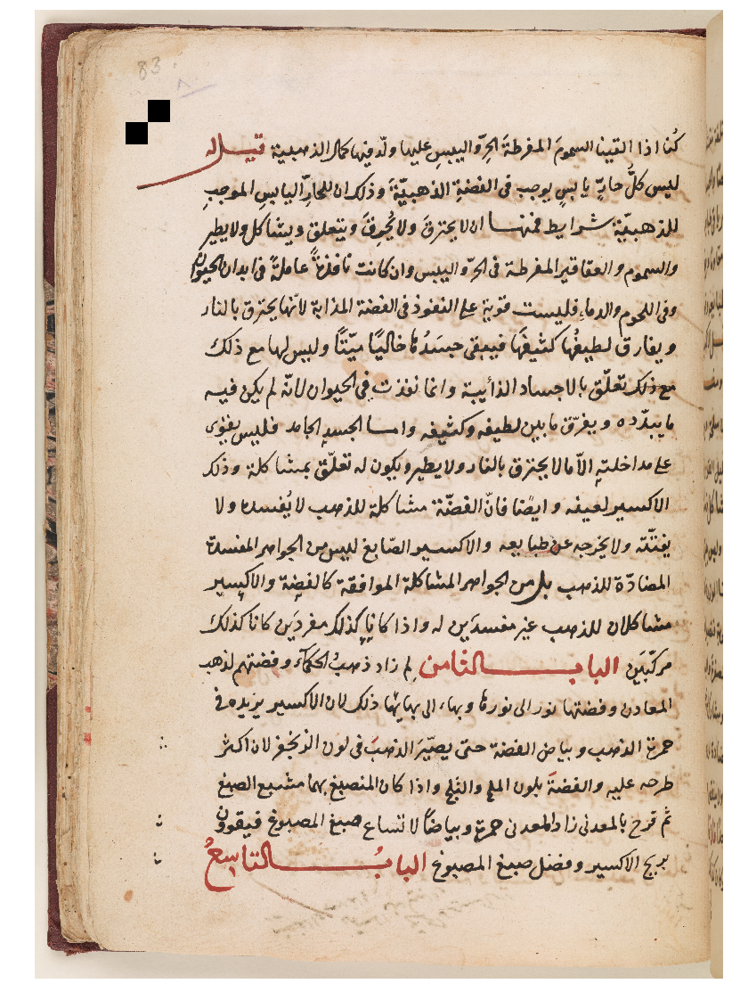

In [29]:
plt.figure(figsize=(20,20))
plt.imshow(im)
plt.axis('off')
plt.show()

In [21]:
coords[0]

(895, 1094)

In [28]:
im[1000:1200, 800:1000] = np.array([0, 0, 0])

In [33]:
from skimage.draw import polygon, polygon_perimeter
import numpy as np

In [30]:
rr, cc = polygon(np.array([c[1] for c in coords]), np.array([c[0] for c in coords]))

In [35]:
rr_p, cc_p = polygon_perimeter(np.array([c[1] for c in coords]), np.array([c[0] for c in coords]), shape=im.shape, clip=True)

In [38]:
im_pp = im.copy()

In [39]:
im_pp[rr_p, cc_p] = np.array([0, 0, 0])

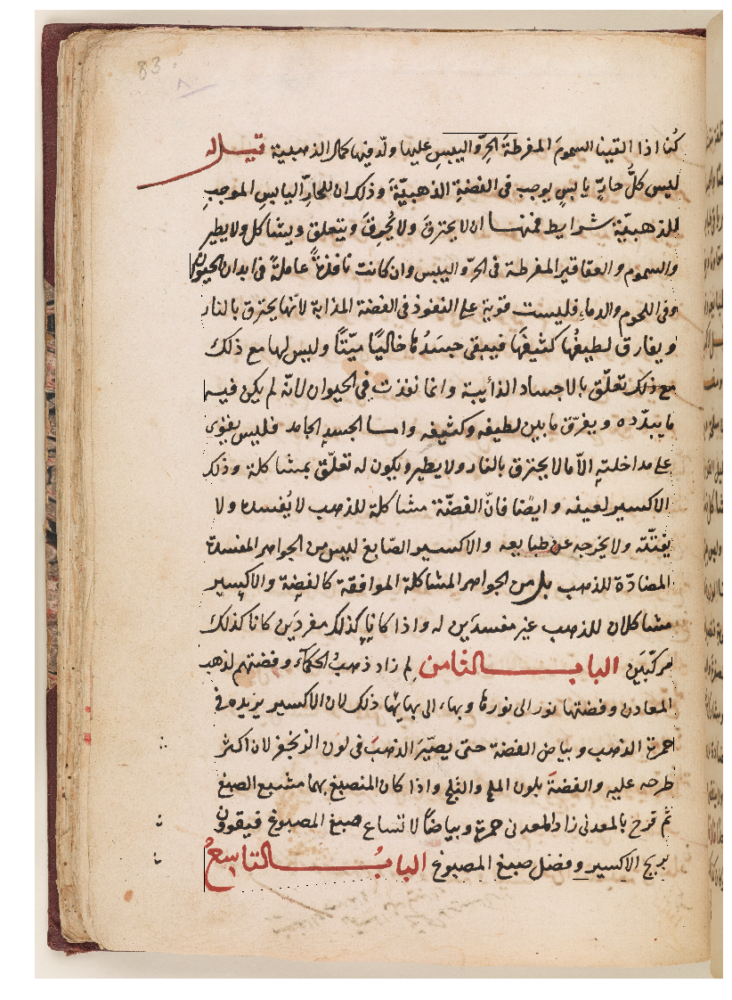

In [40]:
plt.figure(figsize=(20,20))
plt.imshow(im_pp)
plt.axis('off')
plt.show()

In [45]:
im[1090:1100, 885: 905] = np.array([255,131,0])
im[1088: 1108, 3902:3942] = np.array([255, 131, 0])

In [48]:
from skimage.draw import line

In [51]:
rr, cc = line(1094, 895,1098, 3922)
im[rr, cc] = np.array([131, 255, 0])

In [53]:
rr, cc = line(1098, 3922, 1098, 3998)
im[rr, cc] = np.array([131, 255, 0])

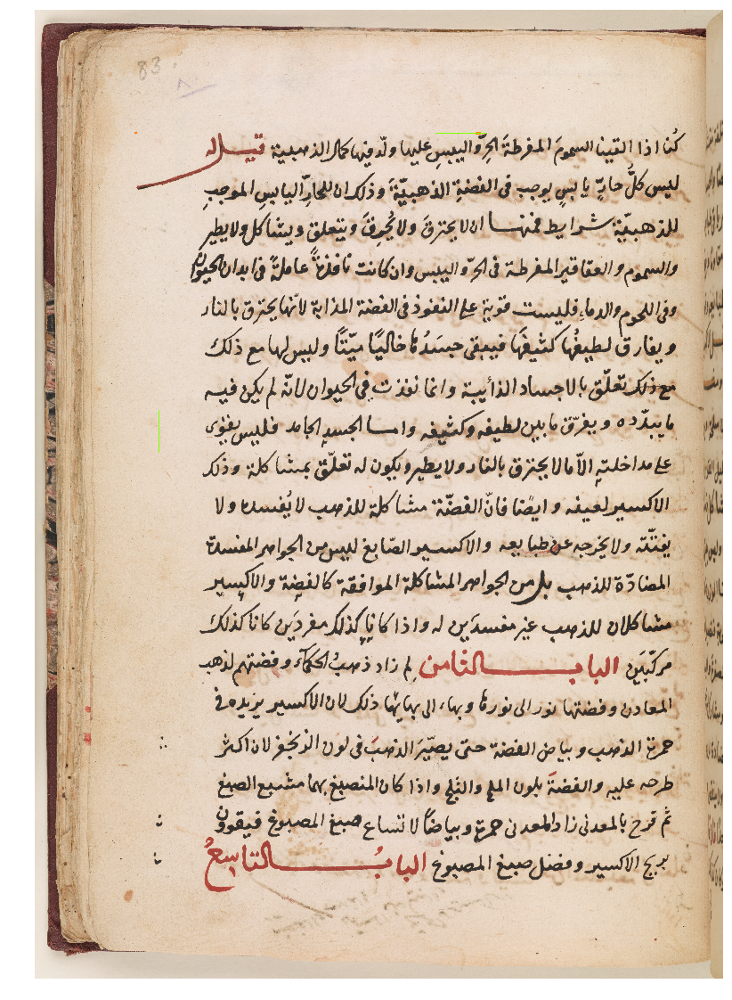

In [54]:
plt.figure(figsize=(20,20))
plt.imshow(im)
plt.axis('off')
plt.show()

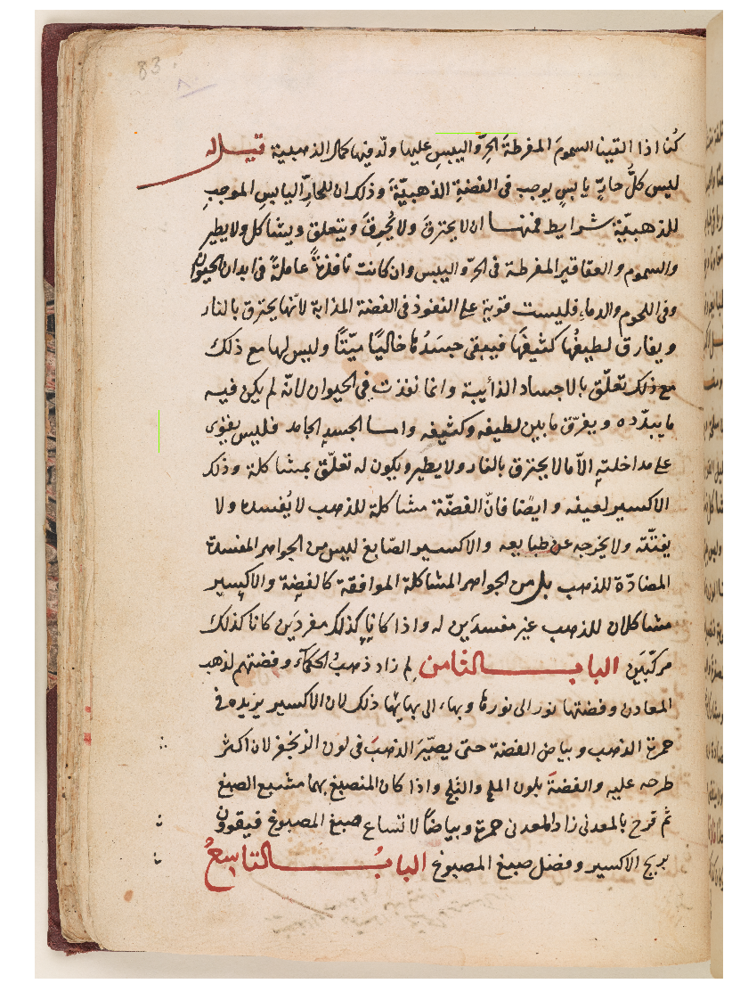

In [55]:
rr, cc = line(1098, 3998, 1095, 5642)
im[rr, cc] = np.array([131, 255, 0])
plt.figure(figsize=(20,20))
plt.imshow(im)
plt.axis('off')
plt.show()

In [57]:
X = [c[0] for c in coords]

In [58]:
Y = [c[1] for c in coords]

In [61]:
image = io.imread('Training_Data/Or 13006_0172.tif')

In [65]:
for i in range(len(X) - 1):
    rr, cc = line(Y[i], X[i], Y[i+1], X[i+1])
    image[rr, cc] = np.array([131, 255, 0])

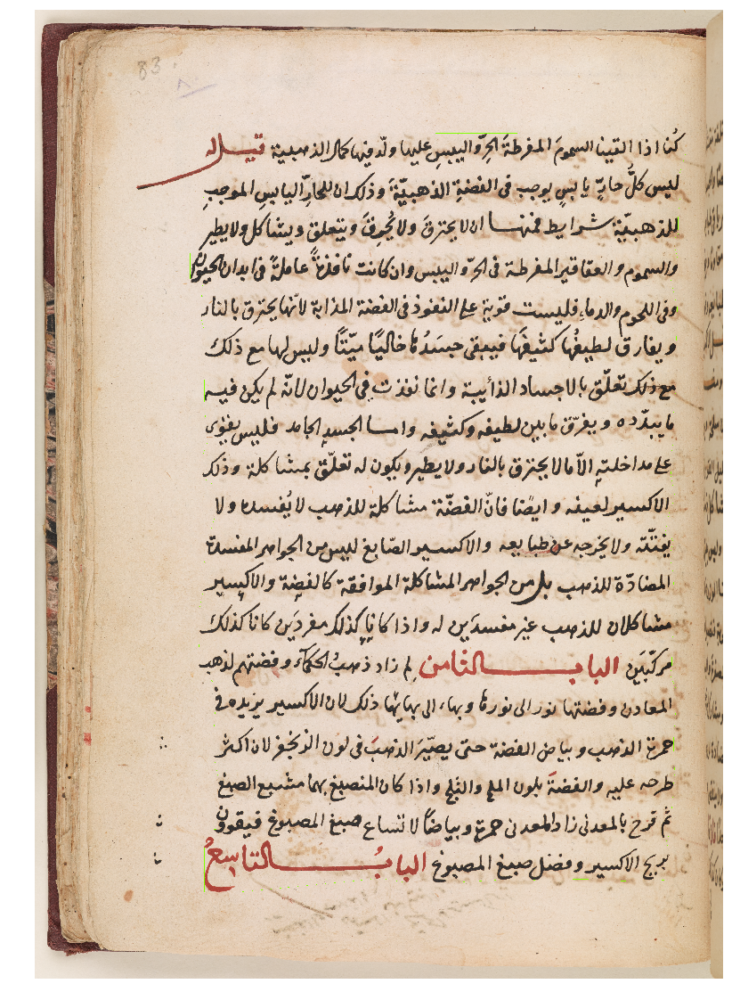

In [66]:
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')s
plt.show()

In [67]:
rr, cc = polygon(Y, X)

In [68]:
image = io.imread('Training_Data/Or 13006_0172.tif')

(8566, 6088, 3)

In [78]:
labels = np.zeros((8566, 6088), dtype=np.uint8)

In [79]:
labels.shape

(8566, 6088)

In [80]:
labels[rr, cc] = 1

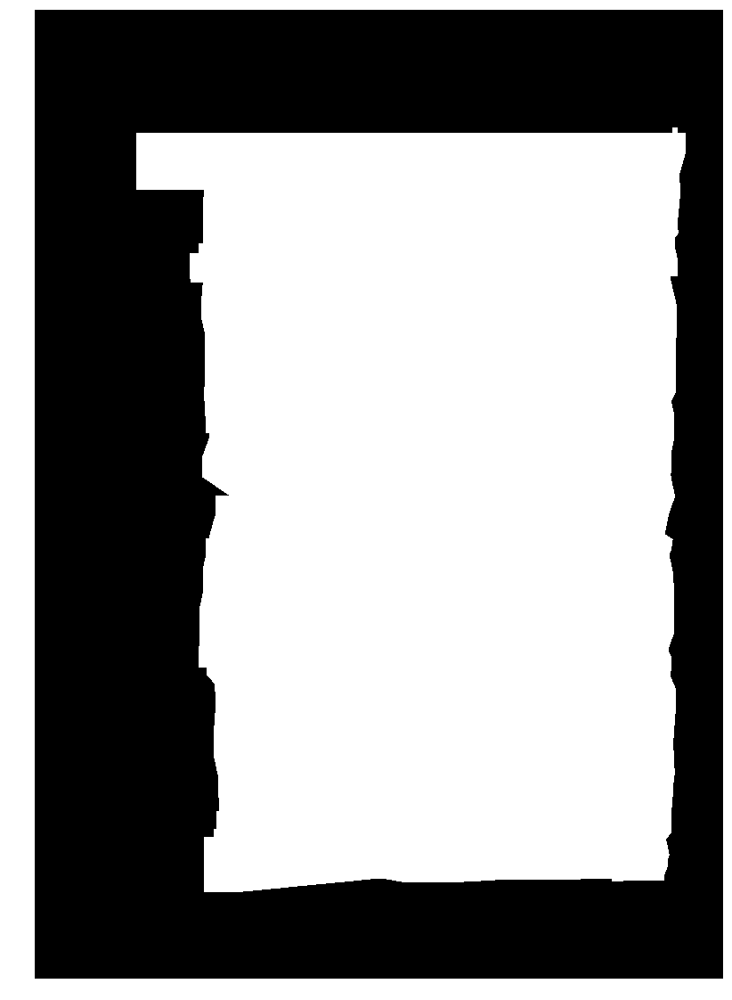

In [81]:
plt.figure(figsize=(20,20))
plt.imshow(labels, cmap='gray')
plt.axis('off')
plt.show()

In [87]:
len(labels[0])

6088

In [84]:
labels.shape

(8566, 6088)

In [88]:
xlen = 6088
ylen = 8566

In [90]:
for i in range(ylen):
    for j in range(xlen):
        label = labels[i][j]
        if label != 1:
            image[i][j] = np.array([0,0,0])

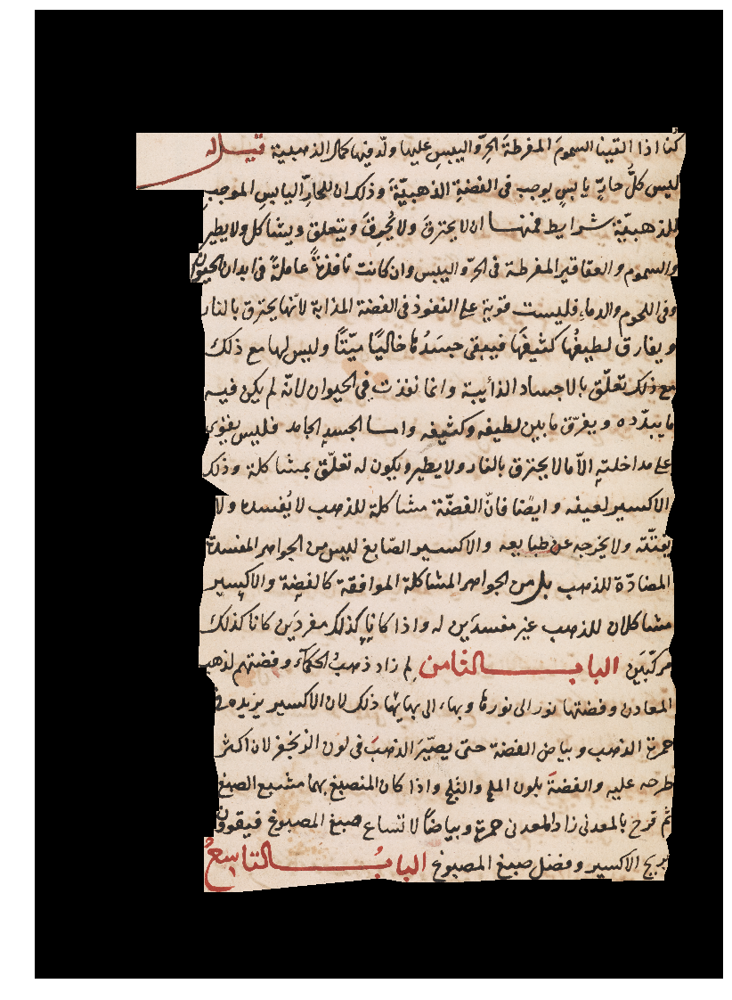

In [91]:
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()